# Evaluación del detector YOLO26 sobre `test`

Este notebook analiza la corrida `yolo26n-peanut-50pct-50e-v1` una vez finalizado el entrenamiento. Muestra la configuración efectiva, las curvas por época, las métricas persistidas, los gráficos generados por Ultralytics y ejemplos de inferencia comparados con las anotaciones reales.

Use como kernel el entorno preparado para este notebook: `/home/enzo/Desktop/CbaHack/cv/.notebook-venv/bin/python`. Este kernel reutiliza PyTorch y Ultralytics del entorno de entrenamiento sin duplicarlos. El notebook no vuelve a entrenar el modelo. La reevaluación completa de `test` es opcional y está desactivada inicialmente para reutilizar las métricas guardadas por el pipeline.

> Ejecútelo solamente cuando `run_summary.json` indique `status: completed`. La primera celda de código comprueba esta condición.

In [1]:
import os
from pathlib import Path

# Evita problemas de permisos con la caché gráfica en algunos entornos.
os.environ.setdefault("MPLCONFIGDIR", "/tmp/cbahack-matplotlib")
Path(os.environ["MPLCONFIGDIR"]).mkdir(parents=True, exist_ok=True)

import csv
import json
import random

import matplotlib.pyplot as plt
import numpy as np
import torch
import yaml
from IPython.display import Markdown, display
from PIL import Image, ImageDraw
from ultralytics import YOLO

RUN_NAME = "yolo26n-peanut-50pct-50e-v1"
CONFIDENCE = 0.25
PREDICTION_IOU = 0.70
MATCH_IOU = 0.50
MAX_EXAMPLES = 4
RECOMPUTE_TEST_METRICS = False

def locate_repo_root(start: Path) -> Path:
    candidates = [start.resolve(), *start.resolve().parents]
    for candidate in candidates:
        if (candidate / "cv" / "scripts" / "train_yolo26.py").is_file():
            return candidate
    raise FileNotFoundError(
        "No se encontró la raíz de CbaHack. Abra el notebook desde el repositorio "
        "o ajuste REPO_ROOT manualmente."
    )

REPO_ROOT = locate_repo_root(Path.cwd())
CV_ROOT = REPO_ROOT / "cv"
RUN_DIR = CV_ROOT / "Models-Roboflow" / RUN_NAME
SUMMARY_PATH = RUN_DIR / "run_summary.json"
BEST_PT = RUN_DIR / "weights" / "best.pt"

if not SUMMARY_PATH.is_file():
    raise RuntimeError(
        f"La corrida todavía no terminó o no existe: {SUMMARY_PATH}"
    )
summary = json.loads(SUMMARY_PATH.read_text(encoding="utf-8"))
if summary.get("status") != "completed":
    raise RuntimeError(
        f"La corrida no está completa. Estado actual: {summary.get('status')!r}"
    )
if not BEST_PT.is_file():
    raise FileNotFoundError(f"No se encontró el mejor checkpoint: {BEST_PT}")

DEVICE = 0 if torch.cuda.is_available() else "cpu"
print(f"Repositorio: {REPO_ROOT}")
print(f"Corrida:     {RUN_DIR}")
print(f"Checkpoint:  {BEST_PT}")
print(f"Dispositivo: {DEVICE}")
print(f"PyTorch:     {torch.__version__}")

Repositorio: /home/enzo/Desktop/CbaHack
Corrida:     /home/enzo/Desktop/CbaHack/cv/Models-Roboflow/yolo26n-peanut-50pct-50e-v1
Checkpoint:  /home/enzo/Desktop/CbaHack/cv/Models-Roboflow/yolo26n-peanut-50pct-50e-v1/weights/best.pt
Dispositivo: 0
PyTorch:     2.7.0+cu128


## 1. Resumen de la corrida

Esta sección usa exclusivamente los artefactos persistidos por el entrenamiento.

In [2]:
config = summary.get("effective_config", {})
dataset_summary = summary.get("dataset", {})
duration_minutes = float(summary.get("duration_seconds", 0)) / 60

rows = [
    ("Estado", summary.get("status")),
    ("Duración", f"{duration_minutes:.1f} min"),
    ("Modelo inicial", config.get("model")),
    ("Épocas solicitadas", config.get("epochs")),
    ("Resolución", config.get("image_size")),
    ("Batch", config.get("batch")),
    ("Dispositivo usado", config.get("device_description")),
    ("AMP", config.get("amp")),
    ("Dataset utilizado", f"{config.get('dataset_percent')} %"),
    ("Imágenes totales", dataset_summary.get("total_images")),
    ("Distribución", dataset_summary.get("split_counts")),
]
table = ["| Campo | Valor |", "|---|---|"]
table.extend(f"| {field} | `{value}` |" for field, value in rows)
display(Markdown("\n".join(table)))

| Campo | Valor |
|---|---|
| Estado | `completed` |
| Duración | `28.1 min` |
| Modelo inicial | `yolo26n.pt` |
| Épocas solicitadas | `50` |
| Resolución | `640` |
| Batch | `-1` |
| Dispositivo usado | `CUDA 0` |
| AMP | `True` |
| Dataset utilizado | `50.0 %` |
| Imágenes totales | `294` |
| Distribución | `{'train': 206, 'val': 44, 'test': 44}` |

## 2. Curvas de entrenamiento

Las curvas permiten detectar convergencia, inestabilidad y posibles señales de sobreajuste. La época destacada es la de mayor `mAP50-95` de validación.

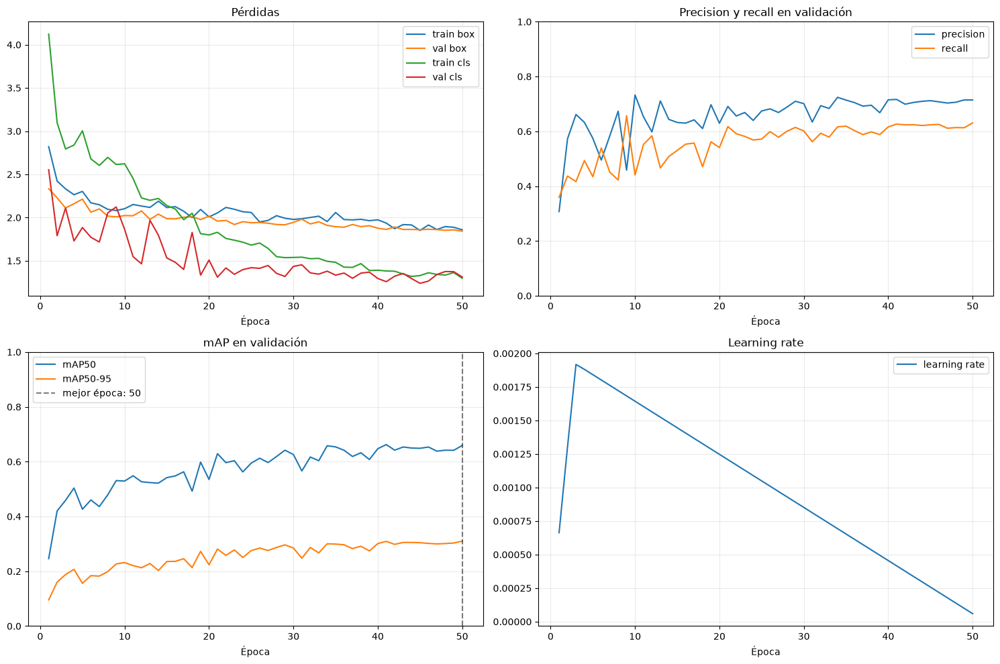

**Mejor época según validación:** 50  
**Precision:** 0.7144 · **Recall:** 0.6305 · **mAP50:** 0.6591 · **mAP50-95:** 0.3099

In [3]:
RESULTS_CSV = RUN_DIR / "results.csv"
if not RESULTS_CSV.is_file():
    raise FileNotFoundError(f"No existe {RESULTS_CSV}")

with RESULTS_CSV.open(encoding="utf-8", newline="") as handle:
    raw_rows = list(csv.DictReader(handle))

history = []
for raw in raw_rows:
    history.append({key.strip(): float(value) for key, value in raw.items()})

epochs = np.array([row["epoch"] for row in history], dtype=int)
best_index = int(np.argmax([row["metrics/mAP50-95(B)"] for row in history]))
best_epoch = int(epochs[best_index])

fig, axes = plt.subplots(2, 2, figsize=(15, 10))

axes[0, 0].plot(epochs, [r["train/box_loss"] for r in history], label="train box")
axes[0, 0].plot(epochs, [r["val/box_loss"] for r in history], label="val box")
axes[0, 0].plot(epochs, [r["train/cls_loss"] for r in history], label="train cls")
axes[0, 0].plot(epochs, [r["val/cls_loss"] for r in history], label="val cls")
axes[0, 0].set_title("Pérdidas")
axes[0, 0].legend()

axes[0, 1].plot(epochs, [r["metrics/precision(B)"] for r in history], label="precision")
axes[0, 1].plot(epochs, [r["metrics/recall(B)"] for r in history], label="recall")
axes[0, 1].set_ylim(0, 1)
axes[0, 1].set_title("Precision y recall en validación")
axes[0, 1].legend()

axes[1, 0].plot(epochs, [r["metrics/mAP50(B)"] for r in history], label="mAP50")
axes[1, 0].plot(epochs, [r["metrics/mAP50-95(B)"] for r in history], label="mAP50-95")
axes[1, 0].axvline(best_epoch, color="black", linestyle="--", alpha=0.5, label=f"mejor época: {best_epoch}")
axes[1, 0].set_ylim(0, 1)
axes[1, 0].set_title("mAP en validación")
axes[1, 0].legend()

axes[1, 1].plot(epochs, [r["lr/pg0"] for r in history], label="learning rate")
axes[1, 1].set_title("Learning rate")
axes[1, 1].legend()

for axis in axes.flat:
    axis.set_xlabel("Época")
    axis.grid(alpha=0.25)
plt.tight_layout()
plt.show()

best_row = history[best_index]
display(Markdown(
    f"**Mejor época según validación:** {best_epoch}  \n"
    f"**Precision:** {best_row['metrics/precision(B)']:.4f} · "
    f"**Recall:** {best_row['metrics/recall(B)']:.4f} · "
    f"**mAP50:** {best_row['metrics/mAP50(B)']:.4f} · "
    f"**mAP50-95:** {best_row['metrics/mAP50-95(B)']:.4f}"
))

## 3. Métricas finales persistidas

El pipeline vuelve a cargar `best.pt` al finalizar y evalúa por separado `val` y `test`. Estos JSON son la referencia principal para informar el resultado de la corrida.

In [4]:
metric_rows = []
persisted_metrics = {}
for split in ("val", "test"):
    metric_path = RUN_DIR / f"{split}_metrics.json"
    if not metric_path.is_file():
        continue
    payload = json.loads(metric_path.read_text(encoding="utf-8"))
    persisted_metrics[split] = payload
    speed = payload.get("speed_ms_per_image", {})
    metric_rows.append((
        split,
        payload.get("precision"),
        payload.get("recall"),
        payload.get("map50"),
        payload.get("map50_95"),
        speed.get("inference"),
    ))

table = [
    "| Split | Precision | Recall | mAP50 | mAP50-95 | Inferencia (ms/imagen) |",
    "|---|---:|---:|---:|---:|---:|",
]
for split, precision, recall, map50, map5095, inference_ms in metric_rows:
    values = [precision, recall, map50, map5095, inference_ms]
    formatted = ["N/D" if value is None else f"{float(value):.4f}" for value in values]
    table.append(f"| {split} | {formatted[0]} | {formatted[1]} | {formatted[2]} | {formatted[3]} | {formatted[4]} |")
display(Markdown("\n".join(table)))

| Split | Precision | Recall | mAP50 | mAP50-95 | Inferencia (ms/imagen) |
|---|---:|---:|---:|---:|---:|
| val | 0.7114 | 0.6328 | 0.6498 | 0.3069 | 23.4440 |
| test | 0.6738 | 0.6416 | 0.6290 | 0.2840 | 25.6932 |

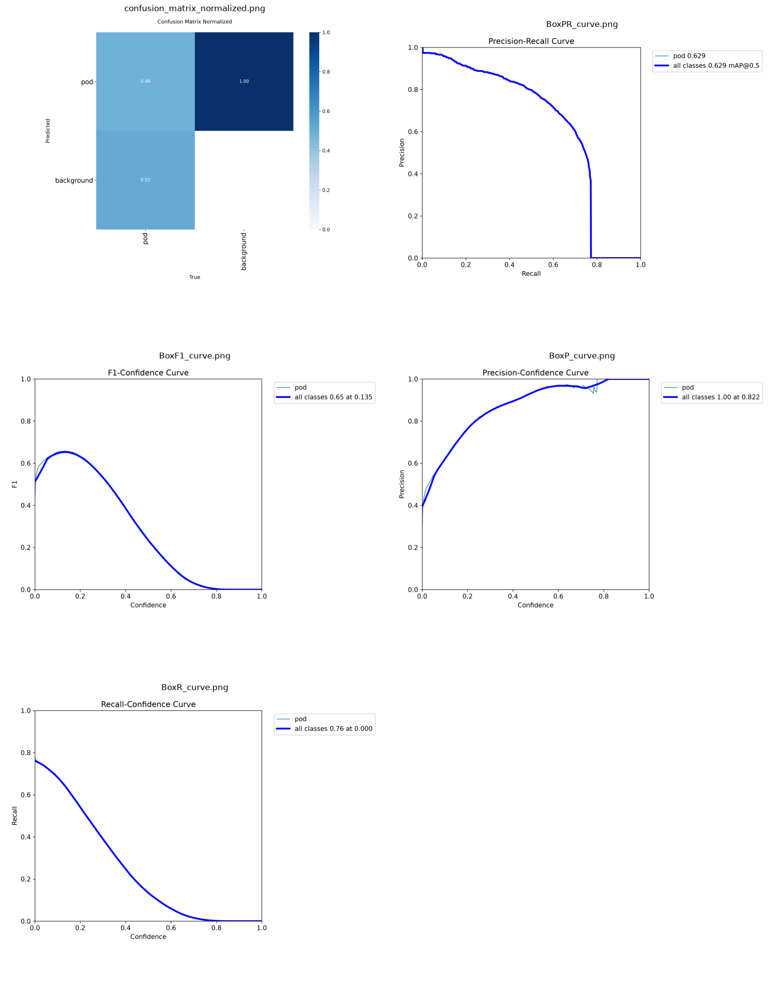

In [5]:
# Muestra curvas y matrices creadas por la evaluación de Ultralytics, si están disponibles.
artifact_names = [
    "confusion_matrix_normalized.png",
    "BoxPR_curve.png",
    "BoxF1_curve.png",
    "BoxP_curve.png",
    "BoxR_curve.png",
]
artifact_roots = [RUN_DIR / "evaluation" / "test", RUN_DIR]
artifacts = []
for name in artifact_names:
    path = next((root / name for root in artifact_roots if (root / name).is_file()), None)
    if path is not None:
        artifacts.append(path)

if not artifacts:
    print("No se encontraron gráficos persistidos. Verifique que la corrida usó --plots.")
else:
    columns = 2
    rows_count = (len(artifacts) + columns - 1) // columns
    fig, axes = plt.subplots(rows_count, columns, figsize=(16, 7 * rows_count))
    axes = np.atleast_1d(axes).ravel()
    for axis, path in zip(axes, artifacts):
        axis.imshow(plt.imread(path))
        axis.set_title(path.name)
        axis.axis("off")
    for axis in axes[len(artifacts):]:
        axis.axis("off")
    plt.tight_layout()
    plt.show()

## 4. Carga de `best.pt` y conjunto de test

Se utiliza exactamente el subset registrado en `run_summary.json`, no una selección nueva.

In [6]:
DATASET_DIR = Path(dataset_summary["directory"])
DATA_YAML = Path(dataset_summary["data_yaml"])
if not DATA_YAML.is_file():
    raise FileNotFoundError(f"No se encontró el data.yaml usado por la corrida: {DATA_YAML}")

data_config = yaml.safe_load(DATA_YAML.read_text(encoding="utf-8"))
TEST_IMAGES_DIR = DATASET_DIR / "images" / "test"
TEST_LABELS_DIR = DATASET_DIR / "labels" / "test"
test_images = sorted(
    path for path in TEST_IMAGES_DIR.iterdir()
    if path.suffix.lower() in {".jpg", ".jpeg", ".png"}
)
if not test_images:
    raise RuntimeError(f"No hay imágenes de test en {TEST_IMAGES_DIR}")

model = YOLO(str(BEST_PT))
IMAGE_SIZE = int(config.get("image_size", 640))
print(f"Clase: {data_config.get('names')}")
print(f"Imágenes de test: {len(test_images)}")
print(f"Resolución de inferencia: {IMAGE_SIZE}")

Clase: {0: 'pod'}
Imágenes de test: 44
Resolución de inferencia: 640


### Reevaluación opcional

La corrida ya genera `test_metrics.json`. Para repetir la evaluación desde el notebook, cambie `RECOMPUTE_TEST_METRICS = True` en la primera celda. Los nuevos artefactos se guardarán dentro de la misma corrida, en `notebook_evaluation/test`.

In [7]:
if RECOMPUTE_TEST_METRICS:
    recomputed = model.val(
        data=str(DATA_YAML),
        split="test",
        imgsz=IMAGE_SIZE,
        batch=1,
        workers=0,
        device=DEVICE,
        project=str(RUN_DIR / "notebook_evaluation"),
        name="test",
        exist_ok=True,
        plots=True,
        verbose=True,
    )
    display(Markdown(
        f"**Reevaluación:** precision={recomputed.box.mp:.4f}, "
        f"recall={recomputed.box.mr:.4f}, mAP50={recomputed.box.map50:.4f}, "
        f"mAP50-95={recomputed.box.map:.4f}"
    ))
else:
    print("Reevaluación omitida; se usan las métricas persistidas por el entrenamiento.")

Reevaluación omitida; se usan las métricas persistidas por el entrenamiento.


## 5. Ejemplos: anotación real frente a predicción

Las cajas verdes son las anotaciones reales. A la derecha se muestran las predicciones de `best.pt` con su confianza. La muestra es determinista para que distintas ejecuciones del notebook sean comparables.

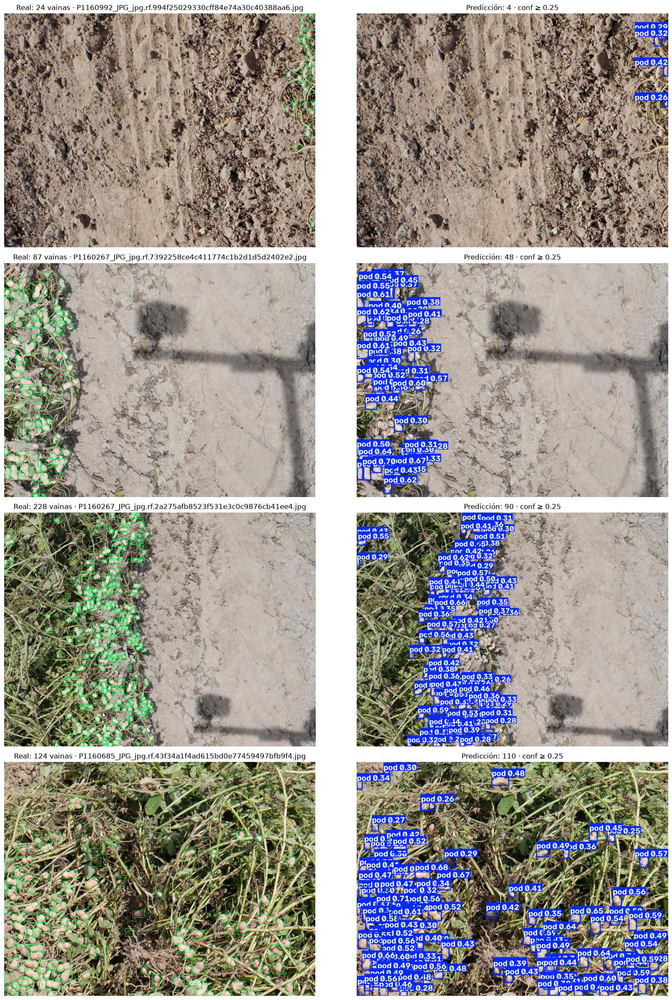

In [8]:
def read_ground_truth(image_path: Path) -> np.ndarray:
    label_path = TEST_LABELS_DIR / f"{image_path.stem}.txt"
    if not label_path.is_file():
        return np.empty((0, 4), dtype=float)
    with Image.open(image_path) as image:
        width, height = image.size
    boxes = []
    for line in label_path.read_text(encoding="utf-8").splitlines():
        if not line.strip():
            continue
        _, x_center, y_center, box_width, box_height = map(float, line.split())
        x1 = (x_center - box_width / 2) * width
        y1 = (y_center - box_height / 2) * height
        x2 = (x_center + box_width / 2) * width
        y2 = (y_center + box_height / 2) * height
        boxes.append((x1, y1, x2, y2))
    return np.asarray(boxes, dtype=float).reshape(-1, 4)

def draw_ground_truth(image_path: Path, boxes: np.ndarray) -> Image.Image:
    image = Image.open(image_path).convert("RGB")
    draw = ImageDraw.Draw(image)
    line_width = max(2, round(max(image.size) / 700))
    for box in boxes:
        draw.rectangle(tuple(box), outline=(0, 255, 80), width=line_width)
    return image

sample_size = min(MAX_EXAMPLES, len(test_images))
sample_images = random.Random(42).sample(test_images, sample_size)
sample_results = model.predict(
    source=[str(path) for path in sample_images],
    imgsz=IMAGE_SIZE,
    conf=CONFIDENCE,
    iou=PREDICTION_IOU,
    max_det=1000,
    device=DEVICE,
    verbose=False,
)

fig, axes = plt.subplots(sample_size, 2, figsize=(18, 6 * sample_size))
axes = np.asarray(axes).reshape(sample_size, 2)
for row_index, (image_path, result) in enumerate(zip(sample_images, sample_results)):
    gt_boxes = read_ground_truth(image_path)
    prediction_count = 0 if result.boxes is None else len(result.boxes)
    axes[row_index, 0].imshow(draw_ground_truth(image_path, gt_boxes))
    axes[row_index, 0].set_title(f"Real: {len(gt_boxes)} vainas · {image_path.name}")
    axes[row_index, 1].imshow(result.plot()[..., ::-1])
    axes[row_index, 1].set_title(f"Predicción: {prediction_count} · conf ≥ {CONFIDENCE}")
    axes[row_index, 0].axis("off")
    axes[row_index, 1].axis("off")
plt.tight_layout()
plt.show()

## 6. Diagnóstico a un umbral fijo

Este análisis empareja predicciones y anotaciones con IoU ≥ `MATCH_IOU`, usando `CONFIDENCE` como umbral. Sirve para inspeccionar falsos positivos y falsos negativos por imagen. No reemplaza las métricas mAP de Ultralytics, que integran múltiples umbrales de confianza e IoU.

In [9]:
def iou_matrix(predicted: np.ndarray, ground_truth: np.ndarray) -> np.ndarray:
    if len(predicted) == 0 or len(ground_truth) == 0:
        return np.zeros((len(predicted), len(ground_truth)), dtype=float)
    top_left = np.maximum(predicted[:, None, :2], ground_truth[None, :, :2])
    bottom_right = np.minimum(predicted[:, None, 2:], ground_truth[None, :, 2:])
    intersection_size = np.clip(bottom_right - top_left, 0, None)
    intersection = intersection_size[..., 0] * intersection_size[..., 1]
    predicted_area = np.prod(np.clip(predicted[:, 2:] - predicted[:, :2], 0, None), axis=1)
    ground_truth_area = np.prod(np.clip(ground_truth[:, 2:] - ground_truth[:, :2], 0, None), axis=1)
    union = predicted_area[:, None] + ground_truth_area[None, :] - intersection
    return np.divide(intersection, union, out=np.zeros_like(intersection), where=union > 0)

def fixed_threshold_counts(
    predicted: np.ndarray, confidences: np.ndarray, ground_truth: np.ndarray, threshold: float
) -> tuple[int, int, int]:
    if len(predicted) == 0:
        return 0, 0, len(ground_truth)
    overlaps = iou_matrix(predicted, ground_truth)
    unmatched_ground_truth = set(range(len(ground_truth)))
    true_positives = 0
    for prediction_index in np.argsort(-confidences):
        candidates = list(unmatched_ground_truth)
        if not candidates:
            break
        candidate_ious = overlaps[prediction_index, candidates]
        best_local_index = int(np.argmax(candidate_ious))
        if candidate_ious[best_local_index] >= threshold:
            unmatched_ground_truth.remove(candidates[best_local_index])
            true_positives += 1
    false_positives = len(predicted) - true_positives
    false_negatives = len(ground_truth) - true_positives
    return true_positives, false_positives, false_negatives

diagnostics = []
prediction_stream = model.predict(
    source=[str(path) for path in test_images],
    stream=True,
    imgsz=IMAGE_SIZE,
    conf=CONFIDENCE,
    iou=PREDICTION_IOU,
    max_det=1000,
    device=DEVICE,
    verbose=False,
)
for result in prediction_stream:
    image_path = Path(result.path)
    ground_truth = read_ground_truth(image_path)
    if result.boxes is None or len(result.boxes) == 0:
        predicted = np.empty((0, 4), dtype=float)
        confidences = np.empty((0,), dtype=float)
    else:
        predicted = result.boxes.xyxy.detach().cpu().numpy()
        confidences = result.boxes.conf.detach().cpu().numpy()
    tp, fp, fn = fixed_threshold_counts(predicted, confidences, ground_truth, MATCH_IOU)
    diagnostics.append({
        "image": image_path.name,
        "gt": len(ground_truth),
        "pred": len(predicted),
        "tp": tp,
        "fp": fp,
        "fn": fn,
    })

total_tp = sum(row["tp"] for row in diagnostics)
total_fp = sum(row["fp"] for row in diagnostics)
total_fn = sum(row["fn"] for row in diagnostics)
fixed_precision = total_tp / (total_tp + total_fp) if total_tp + total_fp else 0.0
fixed_recall = total_tp / (total_tp + total_fn) if total_tp + total_fn else 0.0
fixed_f1 = (
    2 * fixed_precision * fixed_recall / (fixed_precision + fixed_recall)
    if fixed_precision + fixed_recall else 0.0
)
display(Markdown(
    f"### Resultado fijo: conf ≥ {CONFIDENCE}, IoU ≥ {MATCH_IOU}\n"
    f"- TP: **{total_tp}** · FP: **{total_fp}** · FN: **{total_fn}**\n"
    f"- Precision: **{fixed_precision:.4f}** · Recall: **{fixed_recall:.4f}** · F1: **{fixed_f1:.4f}**"
))

worst = sorted(diagnostics, key=lambda row: (row["fn"], row["fp"]), reverse=True)[:10]
table = [
    "| Imagen | Reales | Predichas | TP | FP | FN |",
    "|---|---:|---:|---:|---:|---:|",
]
table.extend(
    f"| {row['image']} | {row['gt']} | {row['pred']} | {row['tp']} | {row['fp']} | {row['fn']} |"
    for row in worst
)
display(Markdown("### Imágenes con más errores\n\n" + "\n".join(table)))

### Resultado fijo: conf ≥ 0.25, IoU ≥ 0.5
- TP: **2331** · FP: **522** · FN: **2683**
- Precision: **0.8170** · Recall: **0.4649** · F1: **0.5926**

### Imágenes con más errores

| Imagen | Reales | Predichas | TP | FP | FN |
|---|---:|---:|---:|---:|---:|
| P1160992_JPG_jpg.rf.450ca14a9b05dab94e11a777222cc19b.jpg | 256 | 88 | 75 | 13 | 181 |
| P1160267_JPG_jpg.rf.2a275afb8523f531e3c0c9876cb41ee4.jpg | 228 | 90 | 72 | 18 | 156 |
| P1160992_JPG_jpg.rf.ce194cb607821da7e1dea2550b2b7220.jpg | 301 | 162 | 145 | 17 | 156 |
| P1160267_JPG_jpg.rf.9a6e1f186daa3d4a1384408d2370c3d0.jpg | 258 | 141 | 107 | 34 | 151 |
| P1160992_JPG_jpg.rf.48f31966929a4dfa1cb5763cfe071579.jpg | 209 | 69 | 63 | 6 | 146 |
| P1160685_JPG_jpg.rf.8148b94350640c9672bf1725161b5841.jpg | 229 | 103 | 87 | 16 | 142 |
| P1160992_JPG_jpg.rf.92090ccbbd2471423ab39e01132c0508.jpg | 301 | 191 | 162 | 29 | 139 |
| P1160992_JPG_jpg.rf.1aca666a69d904dfa05aad8ad86d9150.jpg | 162 | 43 | 34 | 9 | 128 |
| P1160992_JPG_jpg.rf.41ff7e058444dc76e6cdad6d35830dda.jpg | 162 | 39 | 37 | 2 | 125 |
| P1160992_JPG_jpg.rf.656527ae524a2dbbeb310a482d968c48.jpg | 209 | 124 | 98 | 26 | 111 |

## Cómo interpretar el resultado

- Use `mAP50-95` de `val` para comparar experimentos y seleccionar configuraciones.
- Use `test` solamente para informar el rendimiento del modelo candidato, no para ajustar hiperparámetros repetidamente.
- Revise especialmente falsos positivos sobre tierra, piedras, hojas y rastrojo, y falsos negativos en vainas pequeñas u ocluidas.
- Este test proviene del dataset público augmentado. La evaluación decisiva debe hacerse con imágenes naturales tomadas con el celular y montaje reales de la demo.
- El checkpoint recomendado para integración es `weights/best.pt`, no `last.pt`.